## Descriptive analysis of map matched workzones

### Import libraries

In [1]:
import pandas as pd
import numpy as np
import os
import geopandas as gpd
from shapely import wkt
import matplotlib.pyplot as plt
import seaborn as sns

### Read in data

In [2]:
# Original data contains meta data
workzone1 = pd.read_csv("cleaned_2018-2020_workzones.csv", index_col=0)
workzone2 = pd.read_csv("cleaned_2021-2024_workzones.csv", index_col=0)

In [3]:
res1 = pd.read_csv("workzones_mapmatched_2018-2020.csv")

# Convert to correct geometry
res1['geometry'] = res1['geometry'].apply(wkt.loads)
res1 = gpd.GeoDataFrame(res1, geometry='geometry')

In [4]:
workzone1.reset_index(inplace=True)
r18_20 = res1.merge(workzone1, left_on="Workzone_Index", right_on='index', how='left')

In [5]:
res2 = pd.read_csv("workzones_mapmatched_2021-2024.csv")

# Convert to correct geometry
res2['geometry'] = res2['geometry'].apply(wkt.loads)
res2 = gpd.GeoDataFrame(res2, geometry='geometry')

In [6]:
workzone2.reset_index(inplace=True)
r21_24 = res2.merge(workzone2, left_on="Workzone_Index", right_on='index', how='left')

Now you have metadata merged back into all results. Put them all in one big dataframe.

In [7]:
r18_20.drop(columns=['index'], inplace=True)
r21_24.drop(columns=['index'], inplace=True)

In [8]:
r18_20 = r18_20[['Workzone_Index', 'Road_Index', 'geometry', 'EVENTID', 'DIRECTION',
       'ST_RT_NO', 'BEGIN_LOCATION_LATLONG', 'END_LOCATION_LATLONG', 'BEGINNING_DATE', 'ACT_DATETIME_OPENED', 'DURATION_IN_HOURS']]

In [9]:
print(r18_20.shape)
print(r21_24.shape)

(444037, 11)
(304141, 11)


In [10]:
all_data = pd.concat([r18_20, r21_24])
all_data.shape

(748178, 11)

In [11]:
all_data.head()

,Workzone_Index,Road_Index,geometry,EVENTID,DIRECTION,ST_RT_NO,BEGIN_LOCATION_LATLONG,END_LOCATION_LATLONG,BEGINNING_DATE,ACT_DATETIME_OPENED,DURATION_IN_HOURS
0,83,89899,"LINESTRING (685584.179 69269.894, 685584.777 6...",361616,E,3054,"39.9528201289115,-76.7484358158499","39.9514275303733,-76.7476956127466",2018-01-02 07:17:50,2018-01-02 15:55:00,8.619444
1,88,105186,"LINESTRING (376989.922 154778.484, 377020.291 ...",361621,B,4028,"40.697267282843,-80.3890556951048","40.6942457919881,-80.373508844171",2018-01-02 08:16:00,2018-01-02 17:16:00,9.000000
2,88,105187,"LINESTRING (377875.419 154591.284, 377884.942 ...",361621,B,4028,"40.697267282843,-80.3890556951048","40.6942457919881,-80.373508844171",2018-01-02 08:16:00,2018-01-02 17:16:00,9.000000
3,92,49915,"LINESTRING (773552.161 81256.063, 773556.357 8...",361625,B,282,"40.0471409885973,-75.7160158119286","40.035105842437,-75.7093626228477",2018-01-02 08:33:01,2018-01-02 08:34:00,0.016389
4,92,49916,"LINESTRING (773580.326 81235.991, 773588.931 8...",361625,B,282,"40.0471409885973,-75.7160158119286","40.035105842437,-75.7093626228477",2018-01-02 08:33:01,2018-01-02 08:34:00,0.016389


Work zones that span several road segments appear more than one time in the file. Aggregate by Event ID to conglomerate into one geometry and row.

In [12]:
all_agged_data = all_data.groupby('EVENTID').agg({'Workzone_Index': 'first', 'geometry': lambda x: x.unary_union, 'DIRECTION': 'first', 
    'ST_RT_NO': 'first',
    'BEGIN_LOCATION_LATLONG': 'first',
    'END_LOCATION_LATLONG': 'first',
    'BEGINNING_DATE': 'min',
    'ACT_DATETIME_OPENED': 'max'})

C:\Users\quint\AppData\Local\Temp\ipykernel_15164\2066972415.py:1: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  all_agged_data = all_data.groupby('EVENTID').agg({'Workzone_Index': 'first', 'geometry': lambda x: x.unary_union, 'DIRECTION': 'first',


In [13]:
all_agged_data.head()

,Workzone_Index,geometry,DIRECTION,ST_RT_NO,BEGIN_LOCATION_LATLONG,END_LOCATION_LATLONG,BEGINNING_DATE,ACT_DATETIME_OPENED
EVENTID,,,,,,,,
361616,83,"LINESTRING (685584.179 69269.894, 685584.777 6...",E,3054,"39.9528201289115,-76.7484358158499","39.9514275303733,-76.7476956127466",2018-01-02 07:17:50,2018-01-02 15:55:00
361621,88,"MULTILINESTRING ((376989.922 154778.484, 37702...",B,4028,"40.697267282843,-80.3890556951048","40.6942457919881,-80.373508844171",2018-01-02 08:16:00,2018-01-02 17:16:00
361625,92,"MULTILINESTRING ((773552.161 81256.063, 773556...",B,282,"40.0471409885973,-75.7160158119286","40.035105842437,-75.7093626228477",2018-01-02 08:33:01,2018-01-02 08:34:00
361628,95,"MULTILINESTRING ((634148.283 88462.248, 634297...",S,81,"40.153599046815,-77.3023022732082","40.1293449089626,-77.3493401405175",2018-01-02 08:59:10,2018-01-02 14:50:00
361629,96,"MULTILINESTRING ((775682.002 58040.553, 775687...",B,82,"39.8376674032663,-75.6973863879682","39.8401605943598,-75.7100399702765",2018-01-02 09:07:04,2018-01-02 15:48:00


In [14]:
all_data_gdf = gpd.GeoDataFrame(all_agged_data, geometry='geometry')
all_data_gdf.shape

(163751, 8)

In [15]:
all_data_gdf.head(3)

,Workzone_Index,geometry,DIRECTION,ST_RT_NO,BEGIN_LOCATION_LATLONG,END_LOCATION_LATLONG,BEGINNING_DATE,ACT_DATETIME_OPENED
EVENTID,,,,,,,,
361616,83,"LINESTRING (685584.179 69269.894, 685584.777 6...",E,3054,"39.9528201289115,-76.7484358158499","39.9514275303733,-76.7476956127466",2018-01-02 07:17:50,2018-01-02 15:55:00
361621,88,"MULTILINESTRING ((376989.922 154778.484, 37702...",B,4028,"40.697267282843,-80.3890556951048","40.6942457919881,-80.373508844171",2018-01-02 08:16:00,2018-01-02 17:16:00
361625,92,"MULTILINESTRING ((773552.161 81256.063, 773556...",B,282,"40.0471409885973,-75.7160158119286","40.035105842437,-75.7093626228477",2018-01-02 08:33:01,2018-01-02 08:34:00


In [16]:
all_data_gdf['BEGINNING_DATE'] = pd.to_datetime(all_data_gdf['BEGINNING_DATE'], format='mixed')
all_data_gdf['ACT_DATETIME_OPENED'] = pd.to_datetime(all_data_gdf['ACT_DATETIME_OPENED'], format='mixed')
gdf = all_data_gdf.copy()
gdf['geometry'] = gdf['geometry'].buffer(0.0001)
gdf.reset_index(inplace=True)


In [17]:
gdf.to_csv("cleaned_aggregated_workzones.csv")
gdf.shape

(163751, 9)

It was observed upon plotting all work zones with transparency set to 0.1 that many work zones stack onto each other; and in fact, not only do they share space, they share time. This means that these entries should be considered a single work zone. The code below merges the geodataframe with itself using the 'intersects' predicate, meaning that work zone geometries that overlap will be grouped together.

In [18]:
gdf_merged = gpd.sjoin(gdf, gdf, how='inner', predicate='intersects')
gdf_merged.shape

(19607383, 18)

In [19]:
gdf_merged.head()

,EVENTID_left,Workzone_Index_left,geometry,DIRECTION_left,ST_RT_NO_left,BEGIN_LOCATION_LATLONG_left,END_LOCATION_LATLONG_left,BEGINNING_DATE_left,ACT_DATETIME_OPENED_left,index_right,EVENTID_right,Workzone_Index_right,DIRECTION_right,ST_RT_NO_right,BEGIN_LOCATION_LATLONG_right,END_LOCATION_LATLONG_right,BEGINNING_DATE_right,ACT_DATETIME_OPENED_right
0,361616,83,"POLYGON ((685584.777 69268.422, 685601.782 692...",E,3054,"39.9528201289115,-76.7484358158499","39.9514275303733,-76.7476956127466",2018-01-02 07:17:50,2018-01-02 15:55:00,135437,737766,166232,E,3054,"39.9514275303733,-76.7476956127465","39.9415505900581,-76.738866322491",2023-05-02 08:58:00,2023-05-02 14:36:00
0,361616,83,"POLYGON ((685584.777 69268.422, 685601.782 692...",E,3054,"39.9528201289115,-76.7484358158499","39.9514275303733,-76.7476956127466",2018-01-02 07:17:50,2018-01-02 15:55:00,163616,828454,256366,E,3054,"39.9555970987666,-76.749881951937","39.9447264731005,-76.7315819208429",2024-06-12 08:54:34,2024-06-12 14:30:00
0,361616,83,"POLYGON ((685584.777 69268.422, 685601.782 692...",E,3054,"39.9528201289115,-76.7484358158499","39.9514275303733,-76.7476956127466",2018-01-02 07:17:50,2018-01-02 15:55:00,867,365258,3724,N,3054,"39.9528201289115,-76.7484358158499","39.9514275303733,-76.7476956127466",2018-02-01 08:29:50,2018-02-01 15:11:00
0,361616,83,"POLYGON ((685584.777 69268.422, 685601.782 692...",E,3054,"39.9528201289115,-76.7484358158499","39.9514275303733,-76.7476956127466",2018-01-02 07:17:50,2018-01-02 15:55:00,229,363215,1682,E,3054,"39.9528201289115,-76.7484358158499","39.9514275303733,-76.7476956127466",2018-01-15 07:28:33,2018-01-15 15:42:00
0,361616,83,"POLYGON ((685584.777 69268.422, 685601.782 692...",E,3054,"39.9528201289115,-76.7484358158499","39.9514275303733,-76.7476956127466",2018-01-02 07:17:50,2018-01-02 15:55:00,290,363601,2067,E,3054,"39.9528201289115,-76.7484358158499","39.9514275303733,-76.7476956127466",2018-01-18 08:02:10,2018-01-18 15:50:00


In [20]:
gdf_merged.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 19607383 entries, 0 to 163750
Data columns (total 18 columns):
 #   Column                        Dtype         
---  ------                        -----         
 0   EVENTID_left                  int64         
 1   Workzone_Index_left           int64         
 2   geometry                      geometry      
 3   DIRECTION_left                object        
 4   ST_RT_NO_left                 int64         
 5   BEGIN_LOCATION_LATLONG_left   object        
 6   END_LOCATION_LATLONG_left     object        
 7   BEGINNING_DATE_left           datetime64[ns]
 8   ACT_DATETIME_OPENED_left      datetime64[ns]
 9   index_right                   int64         
 10  EVENTID_right                 int64         
 11  Workzone_Index_right          int64         
 12  DIRECTION_right               object        
 13  ST_RT_NO_right                int64         
 14  BEGIN_LOCATION_LATLONG_right  object        
 15  END_LOCATION_LATLONG_right   

Next, what we really want to grab from that self-merged dataframe is those entries that also overlap in time. temp_overlap checks if two workzones that share space also share time, have the same ST_RT_NO and direction.

In [21]:
temp_overlap = gdf_merged[(((gdf_merged['BEGINNING_DATE_left'] >= gdf_merged['BEGINNING_DATE_right']) & (gdf_merged['BEGINNING_DATE_left'] <= gdf_merged['ACT_DATETIME_OPENED_right'])) |
                           ((gdf_merged['BEGINNING_DATE_right'] >= gdf_merged['BEGINNING_DATE_left']) & (gdf_merged['BEGINNING_DATE_right'] <= gdf_merged['ACT_DATETIME_OPENED_left']))) & 
                           (gdf_merged['EVENTID_left'] != gdf_merged['EVENTID_right']) & (gdf_merged['ST_RT_NO_left'] == gdf_merged['ST_RT_NO_right']) & 
                           (gdf_merged['DIRECTION_left'] == gdf_merged['DIRECTION_right'])]

In [22]:
temp_overlap.head()

,EVENTID_left,Workzone_Index_left,geometry,DIRECTION_left,ST_RT_NO_left,BEGIN_LOCATION_LATLONG_left,END_LOCATION_LATLONG_left,BEGINNING_DATE_left,ACT_DATETIME_OPENED_left,index_right,EVENTID_right,Workzone_Index_right,DIRECTION_right,ST_RT_NO_right,BEGIN_LOCATION_LATLONG_right,END_LOCATION_LATLONG_right,BEGINNING_DATE_right,ACT_DATETIME_OPENED_right
11,361644,111,"POLYGON ((806023.963 73636.047, 805931.406 737...",N,476,"39.9703308046581,-75.3371824572185","39.9756355115132,-75.341278830302",2018-01-02 10:44:20,2018-01-02 14:48:00,12,361654,121,N,476,"39.9342758559432,-75.3644513553657","39.9756355115132,-75.341278830302",2018-01-02 13:04:54,2018-01-02 14:48:00
12,361654,121,"POLYGON ((803878.505 69519.03, 803878.505 6951...",N,476,"39.9342758559432,-75.3644513553657","39.9756355115132,-75.341278830302",2018-01-02 13:04:54,2018-01-02 14:48:00,11,361644,111,N,476,"39.9703308046581,-75.3371824572185","39.9756355115132,-75.341278830302",2018-01-02 10:44:20,2018-01-02 14:48:00
54,362354,821,"POLYGON ((411380.746 311433.095, 411380.746 31...",E,4016,"42.1148266867045,-80.0324473791365","42.1159812128161,-80.0293219952428",2018-01-09 08:09:02,2018-01-10 08:25:00,104,362495,962,E,4016,"42.1159812128161,-80.0293219952428","42.117982141344,-80.0238086226155",2018-01-10 08:22:34,2018-01-11 08:31:00
55,362355,822,"POLYGON ((411353.993 311428.391, 411377.6 3114...",W,4016,"42.1160384105003,-80.0293528794277","42.114894049118,-80.0324647618935",2018-01-09 08:10:57,2018-01-10 08:25:00,106,362499,966,W,4016,"42.118036801157,-80.0239066540029","42.1160384105003,-80.0293528794277",2018-01-10 08:24:22,2018-01-11 08:31:00
104,362495,962,"POLYGON ((411472.26 311474.984, 411559.393 311...",E,4016,"42.1159812128161,-80.0293219952428","42.117982141344,-80.0238086226155",2018-01-10 08:22:34,2018-01-11 08:31:00,54,362354,821,E,4016,"42.1148266867045,-80.0324473791365","42.1159812128161,-80.0293219952428",2018-01-09 08:09:02,2018-01-10 08:25:00


In [23]:
temp_overlap.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 6618 entries, 11 to 163700
Data columns (total 18 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   EVENTID_left                  6618 non-null   int64         
 1   Workzone_Index_left           6618 non-null   int64         
 2   geometry                      6618 non-null   geometry      
 3   DIRECTION_left                6618 non-null   object        
 4   ST_RT_NO_left                 6618 non-null   int64         
 5   BEGIN_LOCATION_LATLONG_left   6618 non-null   object        
 6   END_LOCATION_LATLONG_left     6618 non-null   object        
 7   BEGINNING_DATE_left           6618 non-null   datetime64[ns]
 8   ACT_DATETIME_OPENED_left      6618 non-null   datetime64[ns]
 9   index_right                   6618 non-null   int64         
 10  EVENTID_right                 6618 non-null   int64         
 11  Workzone_Index_right    

In [24]:
event_ids = set(temp_overlap['EVENTID_left']) | set(temp_overlap['EVENTID_right'])

In [26]:
temp_overlap.to_csv('temporal_overlap_workzones.csv')

In [27]:
temp_overlap['BEGINNING_DATE'] = temp_overlap.apply(lambda row: min(row['BEGINNING_DATE_left'], row['BEGINNING_DATE_right']), axis=1)
temp_overlap['ACT_DATETIME_OPENED'] = temp_overlap.apply(lambda row: min(row['ACT_DATETIME_OPENED_left'], row['ACT_DATETIME_OPENED_right']), axis=1)
temp_overlap['EVENTID'] = temp_overlap['EVENTID_left']
temp_overlap['ST_RT_NO'] = temp_overlap['ST_RT_NO_left']
temp_overlap['DIRECTION'] = temp_overlap['DIRECTION_left']
temp_overlap_clean = temp_overlap.drop(columns=['EVENTID_left', 'Workzone_Index_left', 'DIRECTION_left',
       'ST_RT_NO_left', 'BEGIN_LOCATION_LATLONG_left',
       'END_LOCATION_LATLONG_left', 'BEGINNING_DATE_left',
       'ACT_DATETIME_OPENED_left', 'index_right', 'EVENTID_right',
       'Workzone_Index_right', 'DIRECTION_right', 'ST_RT_NO_right',
       'BEGIN_LOCATION_LATLONG_right', 'END_LOCATION_LATLONG_right',
       'BEGINNING_DATE_right', 'ACT_DATETIME_OPENED_right'])
temp_overlap_clean.head()

c:\Users\quint\workzone_project\.venv\Lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
c:\Users\quint\workzone_project\.venv\Lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
c:\Users\quint\workzone_project\.venv\Lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.


,geometry,BEGINNING_DATE,ACT_DATETIME_OPENED,EVENTID,ST_RT_NO,DIRECTION
11,"POLYGON ((806023.963 73636.047, 805931.406 737...",2018-01-02 10:44:20,2018-01-02 14:48:00,361644,476,N
12,"POLYGON ((803878.505 69519.03, 803878.505 6951...",2018-01-02 10:44:20,2018-01-02 14:48:00,361654,476,N
54,"POLYGON ((411380.746 311433.095, 411380.746 31...",2018-01-09 08:09:02,2018-01-10 08:25:00,362354,4016,E
55,"POLYGON ((411353.993 311428.391, 411377.6 3114...",2018-01-09 08:10:57,2018-01-10 08:25:00,362355,4016,W
104,"POLYGON ((411472.26 311474.984, 411559.393 311...",2018-01-09 08:09:02,2018-01-10 08:25:00,362495,4016,E


In [28]:
all_data_gdf.columns

Index(['Workzone_Index', 'geometry', 'DIRECTION', 'ST_RT_NO',
       'BEGIN_LOCATION_LATLONG', 'END_LOCATION_LATLONG', 'BEGINNING_DATE',
       'ACT_DATETIME_OPENED'],
      dtype='object')

In [29]:
temp_overlap_clean.columns

Index(['geometry', 'BEGINNING_DATE', 'ACT_DATETIME_OPENED', 'EVENTID',
       'ST_RT_NO', 'DIRECTION'],
      dtype='object')

Finally, merge that data back. We only want to specifically keep those entries that we merged together (temp_overlap_clean) and those that had no overlaps to begin with. Our resulting dataframe should be a little smaller than it originally was.

In [35]:
nidx = all_data_gdf.drop(columns=['END_LOCATION_LATLONG', 'BEGIN_LOCATION_LATLONG', 'Workzone_Index']).reset_index()
no_overlaps = nidx[~nidx['EVENTID'].isin(event_ids)]
if no_overlaps.empty:
    final_result = temp_overlap_clean
else:
    final_result = pd.concat([temp_overlap_clean[['EVENTID', 'geometry', 'DIRECTION',
       'ST_RT_NO', 'BEGINNING_DATE', 'ACT_DATETIME_OPENED']], no_overlaps[['EVENTID', 'geometry', 'DIRECTION',
       'ST_RT_NO', 'BEGINNING_DATE', 'ACT_DATETIME_OPENED']]], ignore_index=True)

In [36]:
no_overlaps.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 157574 entries, 0 to 163750
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   EVENTID              157574 non-null  int64         
 1   geometry             157574 non-null  geometry      
 2   DIRECTION            157574 non-null  object        
 3   ST_RT_NO             157574 non-null  int64         
 4   BEGINNING_DATE       157574 non-null  datetime64[ns]
 5   ACT_DATETIME_OPENED  157574 non-null  datetime64[ns]
dtypes: datetime64[ns](2), geometry(1), int64(2), object(1)
memory usage: 8.4+ MB


In [37]:
final_result.shape

(164192, 6)

In [38]:
final_result.sample(10)

,EVENTID,geometry,DIRECTION,ST_RT_NO,BEGINNING_DATE,ACT_DATETIME_OPENED
68153,499928,"MULTILINESTRING ((684245.877 99513.243, 684361...",W,300,2019-11-19 19:39:58,2019-11-20 05:43:00
8286,368732,"MULTILINESTRING ((620824.233 77402.924, 620842...",S,81,2018-02-26 08:20:15,2018-02-26 14:12:00
162076,822758,"LINESTRING (609205.101 278067.909, 609201.321 ...",B,1005,2024-05-22 05:39:13,2024-05-22 16:26:00
133329,726370,"MULTILINESTRING ((399774.175 126545.757, 39976...",N,79,2023-03-15 18:54:49,2023-03-16 05:45:00
10246,374611,"MULTILINESTRING ((691980.424 71844.45, 692093....",W,462,2018-04-04 19:35:10,2018-04-05 02:42:00
137806,740745,"MULTILINESTRING ((793591.433 278729.525, 79359...",B,370,2023-05-12 08:01:12,2023-05-12 16:35:00
3950,540201,"POLYGON ((745879.66 176930.361, 745935.793 177...",N,81,2020-07-22 07:23:34,2020-07-23 16:35:00
99703,606268,"MULTILINESTRING ((655154.102 74528.398, 655160...",N,15,2021-07-12 09:11:59,2021-07-12 17:44:00
35988,429383,"MULTILINESTRING ((750471.293 49367.107, 750511...",B,3026,2018-12-17 07:53:47,2018-12-17 15:06:00
73610,523280,"LINESTRING (806947.241 67839.361, 806950.004 6...",W,2016,2020-05-07 06:01:16,2020-05-07 16:00:00


In [39]:
final_result.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 164192 entries, 0 to 164191
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   EVENTID              164192 non-null  int64         
 1   geometry             164192 non-null  geometry      
 2   DIRECTION            164192 non-null  object        
 3   ST_RT_NO             164192 non-null  int64         
 4   BEGINNING_DATE       164192 non-null  datetime64[ns]
 5   ACT_DATETIME_OPENED  164192 non-null  datetime64[ns]
dtypes: datetime64[ns](2), geometry(1), int64(2), object(1)
memory usage: 7.5+ MB


### Descriptive Statistics

In [40]:
final_result['Work Zone Duration (days)'] =  final_result['ACT_DATETIME_OPENED'] - final_result['BEGINNING_DATE']

In [41]:
final_result.head()

,EVENTID,geometry,DIRECTION,ST_RT_NO,BEGINNING_DATE,ACT_DATETIME_OPENED,Work Zone Duration (days)
0,361644,"POLYGON ((806023.963 73636.047, 805931.406 737...",N,476,2018-01-02 10:44:20,2018-01-02 14:48:00,0 days 04:03:40
1,361654,"POLYGON ((803878.505 69519.03, 803878.505 6951...",N,476,2018-01-02 10:44:20,2018-01-02 14:48:00,0 days 04:03:40
2,362354,"POLYGON ((411380.746 311433.095, 411380.746 31...",E,4016,2018-01-09 08:09:02,2018-01-10 08:25:00,1 days 00:15:58
3,362355,"POLYGON ((411353.993 311428.391, 411377.6 3114...",W,4016,2018-01-09 08:10:57,2018-01-10 08:25:00,1 days 00:14:03
4,362495,"POLYGON ((411472.26 311474.984, 411559.393 311...",E,4016,2018-01-09 08:09:02,2018-01-10 08:25:00,1 days 00:15:58


In [42]:
final_result['Work Zone Duration (days)'] = final_result['Work Zone Duration (days)'].dt.total_seconds() / 86400

Text(0.5, 1.0, 'Distribution of Work Zone Duration in Days')

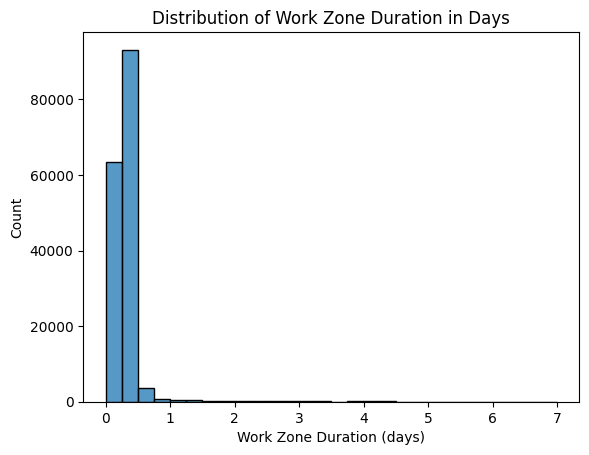

In [43]:
sns.histplot(final_result['Work Zone Duration (days)'], binwidth=0.25).set_title("Distribution of Work Zone Duration in Days")

In [44]:
final_result['Year'] = final_result['BEGINNING_DATE'].dt.year

In [45]:
final_result['Work Zone Length (m)'] = final_result['geometry'].length

(0.0, 20000.0)

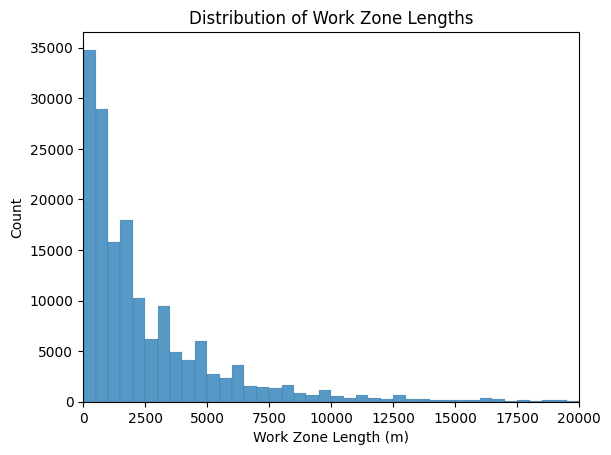

In [46]:
ax = sns.histplot(final_result['Work Zone Length (m)'], binwidth=500)
ax.set_title("Distribution of Work Zone Lengths")
ax.set_xlim([0,20000])

In [47]:
all_roads = gpd.read_file("shapefiles\RMSSEG_(State_Roads)_new.shp")

<>:1: SyntaxWarning: invalid escape sequence '\R'
<>:1: SyntaxWarning: invalid escape sequence '\R'
C:\Users\quint\AppData\Local\Temp\ipykernel_15164\2231744453.py:1: SyntaxWarning: invalid escape sequence '\R'
  all_roads = gpd.read_file("shapefiles\RMSSEG_(State_Roads)_new.shp")


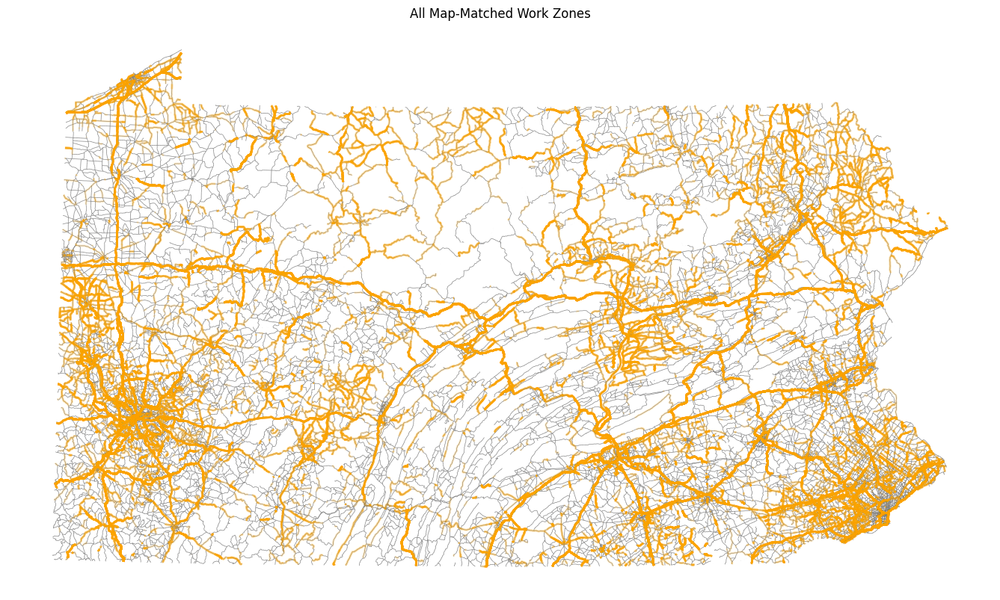

In [48]:
fig, ax = plt.subplots(figsize=(17, 17))
all_roads.plot(ax=ax, linewidth=0.5, color='gray', alpha=1.0)
all_data.plot(ax=ax, edgecolor='orange', linewidth=2.0, alpha=0.2)

# Remove axis
ax.set_axis_off()
ax.set_title("All Map-Matched Work Zones")

# Show plot
plt.show()

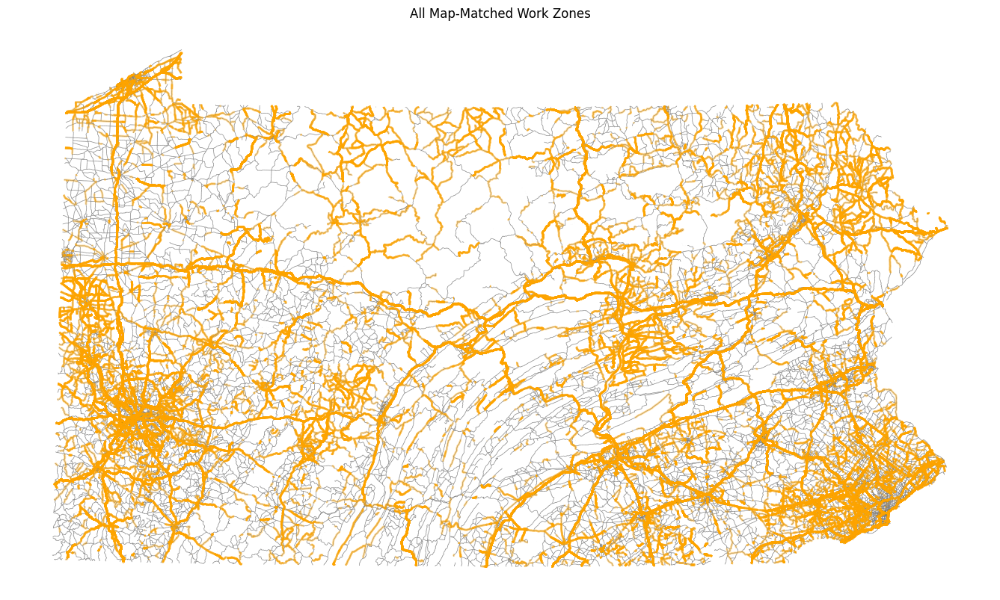

In [49]:
fig, ax = plt.subplots(figsize=(17, 17))
all_roads.plot(ax=ax, linewidth=0.5, color='gray', alpha=1.0)
final_result.plot(ax=ax, edgecolor='orange', linewidth=2.0, alpha=0.4)

# Remove axis
ax.set_axis_off()
ax.set_title("All Map-Matched Work Zones")

# Show plot
plt.show()

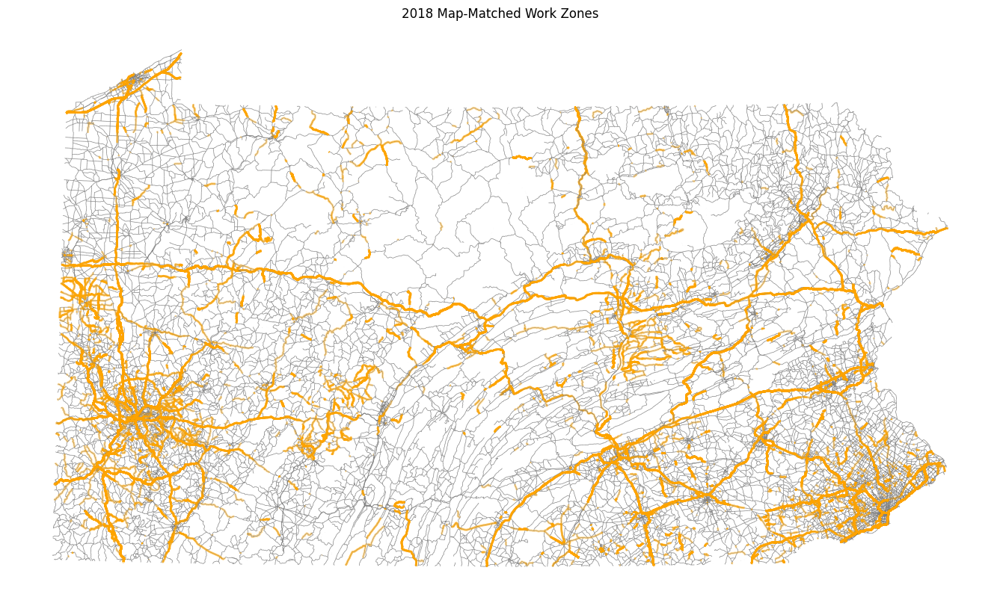

In [50]:
fig, ax = plt.subplots(figsize=(17, 17))
all_roads.plot(ax=ax, linewidth=0.5, color='gray', alpha=1.0)
final_result[final_result['Year'] == 2018].plot(ax=ax, edgecolor='orange', linewidth=2.0, alpha=0.4)

# Remove axis
ax.set_axis_off()
ax.set_title("2018 Map-Matched Work Zones")

# Show plot
plt.show()

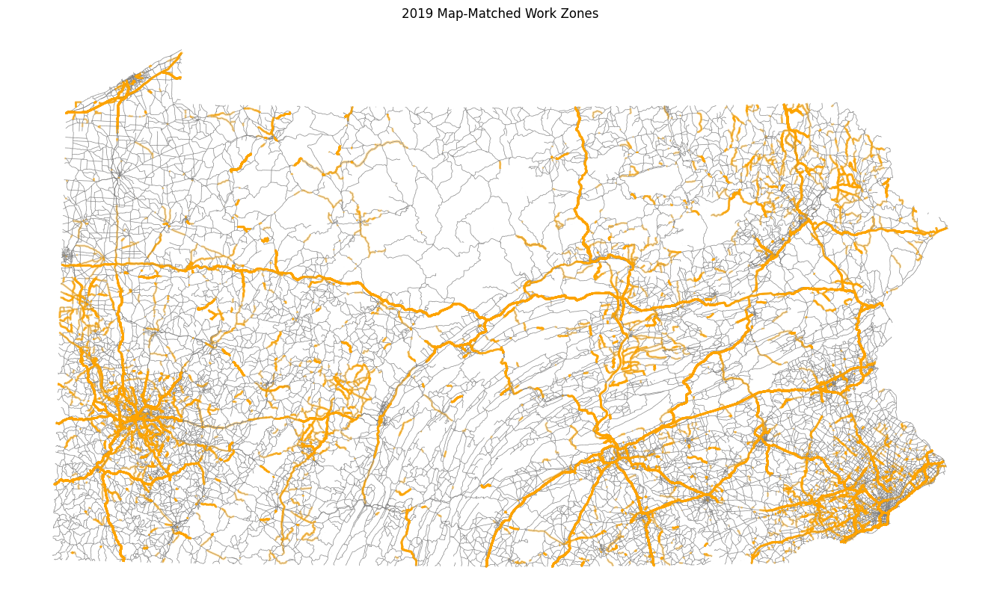

In [51]:
fig, ax = plt.subplots(figsize=(17, 17))
all_roads.plot(ax=ax, linewidth=0.5, color='gray', alpha=1.0)
final_result[final_result['Year'] == 2019].plot(ax=ax, edgecolor='orange', linewidth=2.0, alpha=0.4)

# Remove axis
ax.set_axis_off()
ax.set_title("2019 Map-Matched Work Zones")

# Show plot
plt.show()

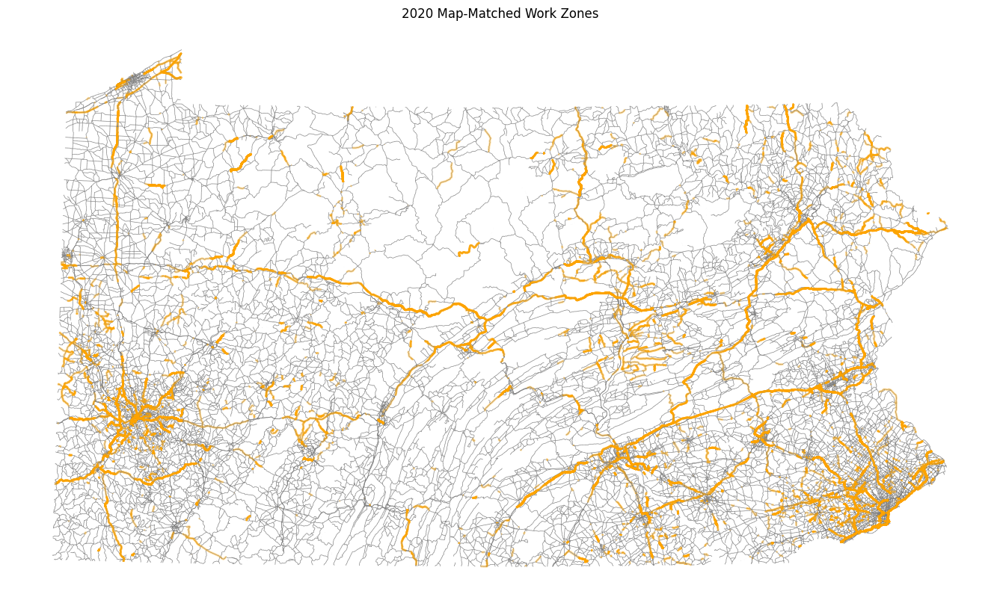

In [52]:
fig, ax = plt.subplots(figsize=(17, 17))
all_roads.plot(ax=ax, linewidth=0.5, color='gray', alpha=1.0)
final_result[final_result['Year'] == 2020].plot(ax=ax, edgecolor='orange', linewidth=2.0, alpha=0.4)

# Remove axis
ax.set_axis_off()
ax.set_title("2020 Map-Matched Work Zones")

# Show plot
plt.show()

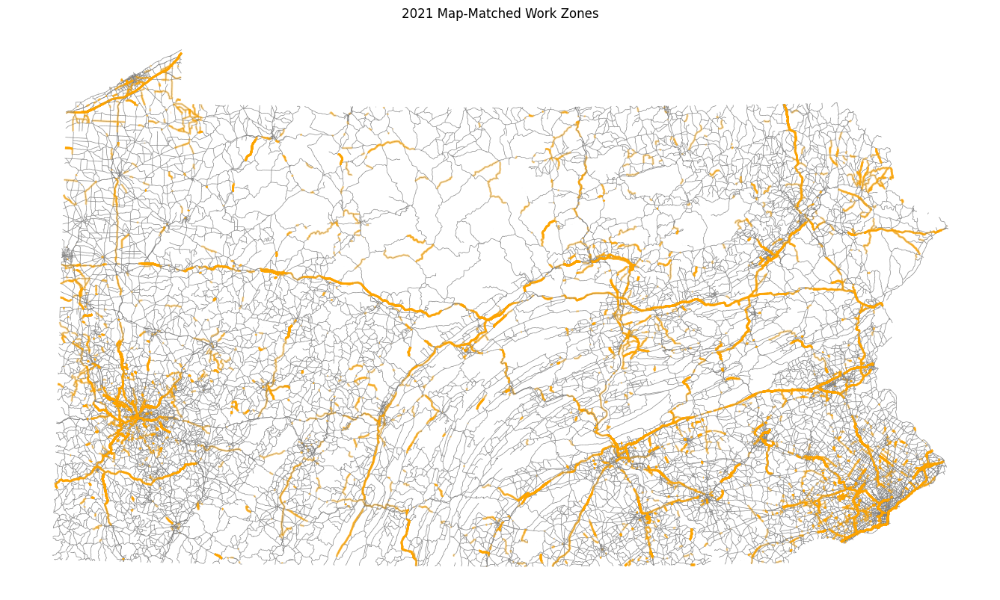

In [53]:
fig, ax = plt.subplots(figsize=(17, 17))
all_roads.plot(ax=ax, linewidth=0.5, color='gray', alpha=1.0)
final_result[final_result['Year'] == 2021].plot(ax=ax, edgecolor='orange', linewidth=2.0, alpha=0.4)

# Remove axis
ax.set_axis_off()
ax.set_title("2021 Map-Matched Work Zones")

# Show plot
plt.show()

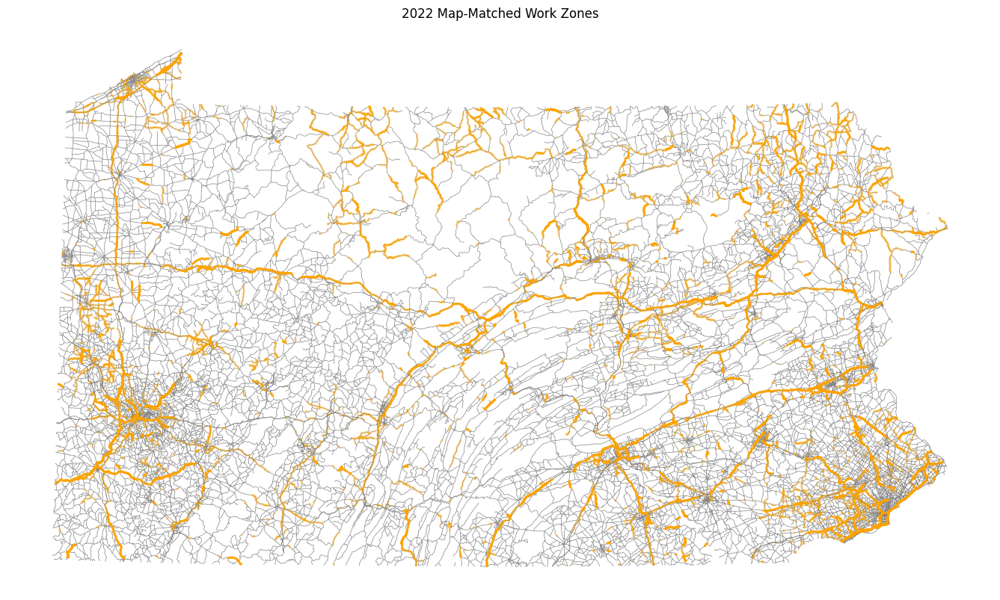

In [54]:
fig, ax = plt.subplots(figsize=(17, 17))
all_roads.plot(ax=ax, linewidth=0.5, color='gray', alpha=1.0)
final_result[final_result['Year'] == 2022].plot(ax=ax, edgecolor='orange', linewidth=2.0, alpha=0.4)

# Remove axis
ax.set_axis_off()
ax.set_title("2022 Map-Matched Work Zones")

# Show plot
plt.show()

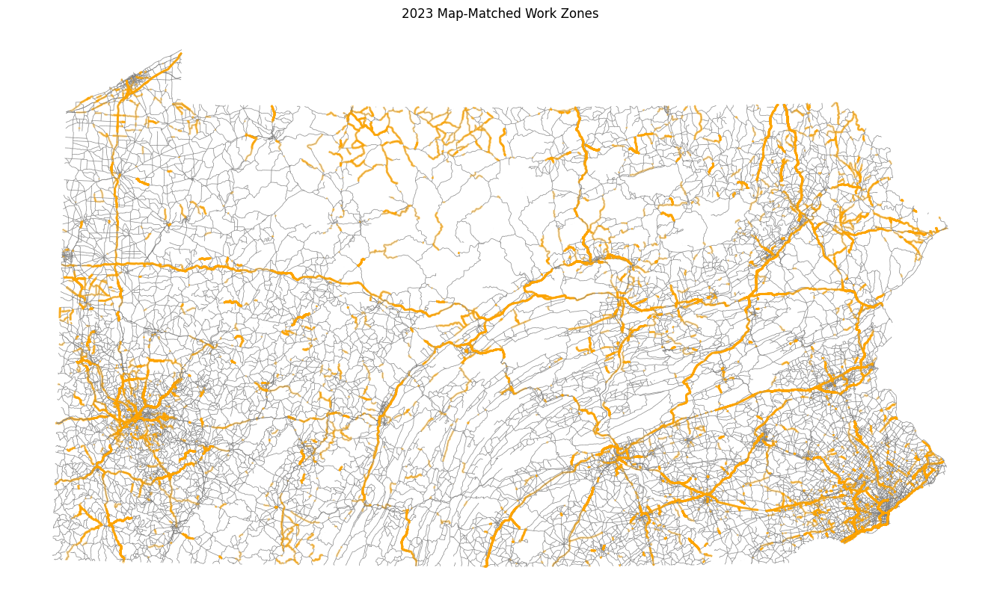

In [55]:
fig, ax = plt.subplots(figsize=(17, 17))
all_roads.plot(ax=ax, linewidth=0.5, color='gray', alpha=1.0)
final_result[final_result['Year'] == 2023].plot(ax=ax, edgecolor='orange', linewidth=2.0, alpha=0.4)

# Remove axis
ax.set_axis_off()
ax.set_title("2023 Map-Matched Work Zones")

# Show plot
plt.show()

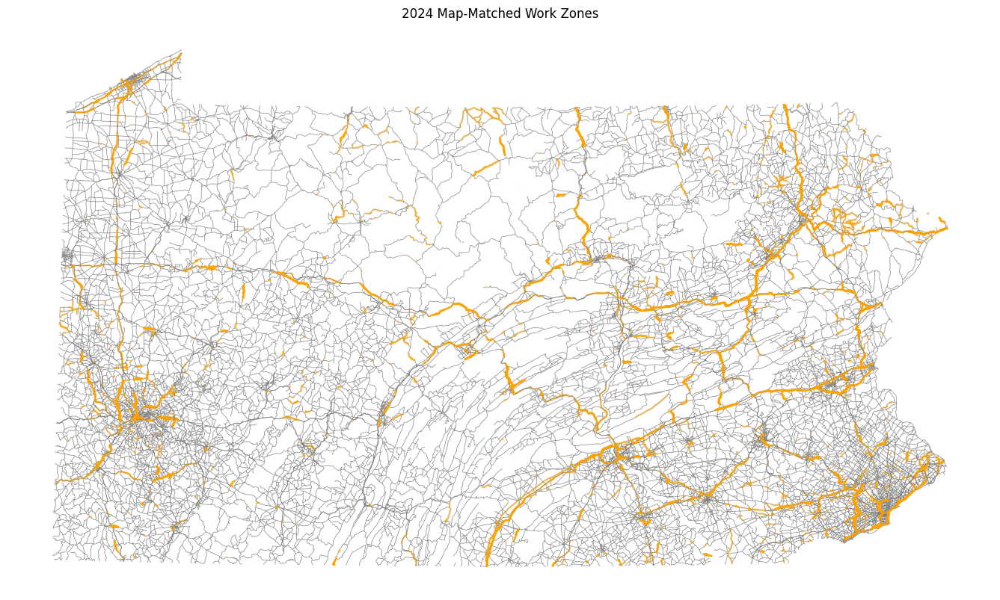

In [56]:
fig, ax = plt.subplots(figsize=(17, 17))
all_roads.plot(ax=ax, linewidth=0.5, color='gray', alpha=1.0)
final_result[final_result['Year'] == 2024].plot(ax=ax, edgecolor='orange', linewidth=2.0, alpha=0.4)

# Remove axis
ax.set_axis_off()
ax.set_title("2024 Map-Matched Work Zones")

# Show plot
plt.show()

In [57]:
final_result[final_result['Year'] == 2018].describe()

,EVENTID,ST_RT_NO,BEGINNING_DATE,ACT_DATETIME_OPENED,Work Zone Duration (days),Year,Work Zone Length (m)
count,31643.000000,31643.000000,31643,31643,31643.000000,31643.0,31643.000000
mean,398395.459312,799.987959,2018-07-19 06:59:47.082861824,2018-07-19 14:49:49.736118784,0.326420,2018.0,4086.002477
min,361616.000000,1.000000,2018-01-02 07:17:50,2018-01-02 08:34:00,0.000023,2018.0,0.252722
25%,383147.000000,78.000000,2018-05-14 20:46:54,2018-05-15 05:03:00,0.189664,2018.0,667.520996
50%,398463.000000,194.000000,2018-07-19 12:27:08,2018-07-19 20:46:00,0.281632,2018.0,1738.235003
75%,414119.500000,1006.000000,2018-09-27 08:47:48.500000,2018-09-27 16:25:00,0.370961,2018.0,4601.950306
max,431033.000000,6309.000000,2018-12-31 08:18:42,2018-12-31 14:17:00,6.926574,2018.0,169659.963903
std,18448.011065,1176.978179,NaN,NaN,0.420645,0.0,7688.076222


In [58]:
final_result[final_result['Year'] == 2019].describe()

,EVENTID,ST_RT_NO,BEGINNING_DATE,ACT_DATETIME_OPENED,Work Zone Duration (days),Year,Work Zone Length (m)
count,34885.000000,34885.000000,34885,34885,34885.000000,34885.0,34885.000000
mean,468225.647327,795.873843,2019-07-02 20:43:17.996130304,2019-07-03 04:21:38.576465152,0.318294,2019.0,3944.388490
min,431156.000000,1.000000,2019-01-02 02:37:11,2019-01-02 03:34:00,0.000069,2019.0,0.174593
25%,452204.000000,76.000000,2019-04-29 09:22:37,2019-04-29 16:02:00,0.189491,2019.0,561.293004
50%,468139.000000,194.000000,2019-07-02 08:14:00,2019-07-02 14:53:00,0.272153,2019.0,1530.569298
75%,484419.000000,1006.000000,2019-09-09 10:23:22,2019-09-09 18:50:00,0.363287,2019.0,4038.289250
max,506428.000000,6579.000000,2019-12-31 17:25:14,2019-12-31 17:30:00,6.964201,2019.0,315069.702610
std,19492.581691,1185.384884,NaN,NaN,0.411879,0.0,8628.902671


In [59]:
final_result[final_result['Year'] == 2020].describe()

,EVENTID,ST_RT_NO,BEGINNING_DATE,ACT_DATETIME_OPENED,Work Zone Duration (days),Year,Work Zone Length (m)
count,21559.000000,21559.000000,21559,21559,21559.000000,21559.0,21559.000000
mean,539221.157243,679.902129,2020-07-13 13:27:29.597569280,2020-07-13 21:49:33.741824768,0.348659,2020.0,2384.699713
min,504803.000000,1.000000,2020-01-02 07:48:36,2020-01-02 09:45:00,0.000035,2020.0,0.301412
25%,526267.500000,76.000000,2020-05-21 07:42:28.500000,2020-05-21 15:27:00,0.218119,2020.0,549.462723
50%,539553.000000,100.000000,2020-07-21 06:37:53,2020-07-21 13:58:00,0.295845,2020.0,1431.019306
75%,552992.500000,886.000000,2020-09-18 08:42:11.500000,2020-09-18 16:07:30,0.380104,2020.0,3135.550427
max,571096.000000,6579.000000,2020-12-31 09:31:19,2020-12-31 14:27:00,6.948611,2020.0,126757.960637
std,16753.517753,1059.787967,NaN,NaN,0.430078,0.0,3433.564440


In [60]:
final_result[final_result['Year'] == 2021].describe()

,EVENTID,ST_RT_NO,BEGINNING_DATE,ACT_DATETIME_OPENED,Work Zone Duration (days),Year,Work Zone Length (m)
count,20771.000000,20771.000000,20771,20771,20771.000000,20771.0,20771.000000
mean,608278.498772,659.744933,2021-07-17 08:18:52.714409472,2021-07-17 16:05:19.067931136,0.323916,2021.0,2429.860747
min,570322.000000,1.000000,2021-01-02 08:32:03,2021-01-02 11:51:00,0.000023,2021.0,0.264041
25%,592454.500000,70.000000,2021-05-07 09:01:40.500000,2021-05-07 16:01:00,0.207170,2021.0,595.329998
50%,608414.000000,95.000000,2021-07-20 20:57:06,2021-07-21 05:38:00,0.285012,2021.0,1478.469064
75%,624696.000000,581.000000,2021-09-29 11:10:44.500000,2021-09-29 19:38:00,0.370689,2021.0,3218.439426
max,642466.000000,6579.000000,2021-12-31 02:28:50,2021-12-31 03:40:00,6.994259,2021.0,72705.800926
std,18849.501055,1083.437783,NaN,NaN,0.377079,0.0,3325.545270


In [61]:
final_result[final_result['Year'] == 2022].describe()

,EVENTID,ST_RT_NO,BEGINNING_DATE,ACT_DATETIME_OPENED,Work Zone Duration (days),Year,Work Zone Length (m)
count,21185.000000,21185.000000,21185,21185,21185.000000,21185.0,21185.000000
mean,680327.479962,686.641256,2022-07-15 02:21:52.246778368,2022-07-15 10:09:04.653292288,0.324449,2022.0,2416.860570
min,642681.000000,1.000000,2022-01-03 07:35:53,2022-01-03 10:55:00,0.000069,2022.0,0.253775
25%,665569.000000,70.000000,2022-05-09 20:59:06,2022-05-10 05:47:00,0.206100,2022.0,615.706310
50%,680744.000000,95.000000,2022-07-18 08:46:55,2022-07-18 15:27:00,0.283704,2022.0,1518.268317
75%,695695.000000,858.000000,2022-09-22 19:58:09,2022-09-23 05:19:00,0.370671,2022.0,3189.636156
max,714710.000000,6579.000000,2022-12-31 07:59:00,2022-12-31 17:13:00,6.821065,2022.0,89183.407120
std,18399.774686,1101.215080,NaN,NaN,0.394059,0.0,3259.887304


In [62]:
final_result[final_result['Year'] == 2023].describe()

,EVENTID,ST_RT_NO,BEGINNING_DATE,ACT_DATETIME_OPENED,Work Zone Duration (days),Year,Work Zone Length (m)
count,24413.000000,24413.000000,24413,24413,24413.000000,24413.0,24413.000000
mean,755162.390612,635.270757,2023-07-10 21:31:39.643878400,2023-07-11 05:03:24.363248896,0.313712,2023.0,2619.619022
min,714919.000000,1.000000,2023-01-03 07:30:26,2023-01-03 10:55:00,0.000046,2023.0,0.301422
25%,738501.000000,63.000000,2023-05-04 09:30:30,2023-05-04 17:57:00,0.209942,2023.0,674.308177
50%,755632.000000,119.000000,2023-07-12 20:43:58,2023-07-13 07:06:00,0.285926,2023.0,1594.320637
75%,772523.000000,676.000000,2023-09-20 08:11:34,2023-09-20 14:54:00,0.367118,2023.0,3311.358785
max,792822.000000,6579.000000,2023-12-30 22:41:56,2023-12-30 22:51:00,6.990648,2023.0,65808.036081
std,20489.427417,1054.695599,NaN,NaN,0.322192,0.0,3480.547427


In [63]:
final_result[final_result['Year'] == 2024].describe()

,EVENTID,ST_RT_NO,BEGINNING_DATE,ACT_DATETIME_OPENED,Work Zone Duration (days),Year,Work Zone Length (m)
count,9736.000000,9736.000000,9736,9736,9736.000000,9736.0,9736.000000
mean,814142.446795,713.818406,2024-04-16 03:46:29.042933504,2024-04-16 11:15:38.208710144,0.311912,2024.0,2433.108757
min,790189.000000,1.000000,2024-01-02 07:38:09,2024-01-02 11:40:00,0.000023,2024.0,0.264041
25%,806836.500000,78.000000,2024-03-19 10:08:19,2024-03-19 15:18:30,0.199549,2024.0,606.056658
50%,815281.500000,144.000000,2024-04-24 07:53:12,2024-04-24 14:29:00,0.279352,2024.0,1519.367030
75%,822115.250000,910.000000,2024-05-20 09:46:39.500000,2024-05-20 17:49:30,0.363796,2024.0,3206.716565
max,828963.000000,6579.000000,2024-06-13 11:14:57,2024-06-13 13:55:00,6.918206,2024.0,112942.574159
std,9567.196692,1117.266108,NaN,NaN,0.351635,0.0,3433.684221


In [64]:
final_result.describe()

,EVENTID,ST_RT_NO,BEGINNING_DATE,ACT_DATETIME_OPENED,Work Zone Duration (days),Year,Work Zone Length (m)
count,164192.000000,164192.000000,164192,164192,164192.000000,164192.000000,164192.000000
mean,572348.889227,721.379519,2020-12-25 14:20:15.865078784,2020-12-25 22:07:14.747856128,0.324293,2020.469895,3091.614968
min,361616.000000,1.000000,2018-01-02 07:17:50,2018-01-02 08:34:00,0.000023,2018.000000,0.174593
25%,453238.500000,76.000000,2019-05-02 08:48:41.750000128,2019-05-02 15:13:00,0.202095,2019.000000,608.532087
50%,551622.500000,124.000000,2020-09-13 12:40:47,2020-09-14 01:41:00,0.282824,2020.000000,1571.071850
75%,690930.500000,910.000000,2022-08-31 09:34:01,2022-08-31 17:51:45,0.369502,2022.000000,3477.829707
max,828963.000000,6579.000000,2024-06-13 11:14:57,2024-06-13 13:55:00,6.994259,2024.000000,315069.702610
std,136830.339899,1123.233994,NaN,NaN,0.394115,1.921480,5883.185781
